# Analyse polymer dynamics of OU simulations

In [1]:
#Include necessary librarires
using Plots
using FFTW
using LinearAlgebra
using Statistics
using Printf
using LaTeXStrings
using Statistics

#Default Plots options
gr(); #gr Backend
default(
    fontfamily="Helvetica",
    tickfontsize=10,
    guidefontsize=12,
    legendfontsize=10,
    formatter = x -> @sprintf("%.3f", x)
)

## Functions

In [2]:
#Define functions

#Function for giration vector
#Returns: giration vector
function calcgir(datasr_::Array{Float64,3}, N_::Int32, start_::Int64, end_::Int64, skip_::Int64)
    times::Int64 = length(@view(datasr_[:,1,1]));
    corrr::Vector{Float64} = zeros(N_);
    r1fft::Vector{ComplexF64} = zeros(ComplexF64, N_÷2+1);
    r2fft::Vector{ComplexF64} = zeros(ComplexF64, N_÷2+1);
    r3fft::Vector{ComplexF64} = zeros(ComplexF64, N_÷2+1);

    for i in start_:skip_:end_
            r1fft = fft(@view(datasr_[i,:,1]));
            r2fft = fft(@view(datasr_[i,:,2]));
            r3fft = fft(@view(datasr_[i,:,3]));
            corrr .+= -2*real.(ifft(abs.(r1fft).^2+abs.(r2fft).^2+abs.(r3fft).^2)).+2 .*sum(abs.(r1fft).^2+abs.(r2fft).^2+abs.(r3fft).^2)/N_;
    end
    return corrr/N_/((end_-start_)/skip_);
end

#Function for radius of giration dynamics
function gyration_dynamics(datasr_::Array{Float64,3}, N_::Int32)

    times = length(@view(datasr_[:,1,1]));
    gyration_t = zeros(times);
    corrr::Vector{Float64} = zeros(N_);
    r1fft::Vector{ComplexF64} = zeros(ComplexF64, N_÷2+1);
    r2fft::Vector{ComplexF64} = zeros(ComplexF64, N_÷2+1);
    r3fft::Vector{ComplexF64} = zeros(ComplexF64, N_÷2+1);

    for i in 1:times
        r1fft = fft(@view(datasr_[i,:,1]));
        r2fft = fft(@view(datasr_[i,:,2]));
        r3fft = fft(@view(datasr_[i,:,3]));
        corrr = -2*real.(ifft(abs.(r1fft).^2+abs.(r2fft).^2+abs.(r3fft).^2)).+2 .*sum(abs.(r1fft).^2+abs.(r2fft).^2+abs.(r3fft).^2)/N_;
        gyration_t[i] = corrr[N÷2]/N_;
    end
    return gyration_t;

end


#Function to plot dynamics of average profile of epigenetic field
function plot_totprof(dts::AbstractVector, profile::Matrix{Float64}, tot_time::Int64; figsize=(400,300))
    N::Int64 = length(@view(profile[1,:]));
    time_length::Int64 = length(@view(profile[:,1]));
    true_time::Int64 = tot_time;
    if tot_time > time_length
        true_time = time_length;
    end
    tot_sum::Vector{Float64} = zeros(true_time);
    for i in eachindex(tot_sum)
        tot_sum[i] = sum(@view(profile[i,:]))/N;
    end
    plot(dts, tot_sum,size=figsize,
        color=:orange, 
        yguidefont = font(12, "Helvetica",:orange),
        xformatter = x -> @sprintf("%.0f", x),
        yformatter = x -> @sprintf("%.2f", x),
        legend=false)
    xlabel!("Time")
    ylabel!("Total concentration")
end

#Function to calculate correlation functions and averages
#Returns: correlation func., conn. correlation func., average over time
function calccorrh(datash_::Matrix{Float64}, Nt_::Int32, start_::Int64, end_::Int64, skip_::Int64)
        
    N = length(@view(datash_[1,:]));
    times = end_-start_;
    tot::Int64 = (length(@view(datash_[:,1]))-start_)/(skip_);
    corrh::Vector{Float64} = zeros(N);
    corrhfromfourier::Vector{Float64} = zeros(N);
    avgh1::Float64 = 0.0;
    avgh::Vector{Float64} = zeros(Float64, N);
    avgt::Vector{Float64} = zeros(tot);
    hk::Vector{ComplexF64} = zeros(ComplexF64, N÷2+1);
    hks::Vector{Float64} = zeros(Float64, N÷2+1);
    
    # for i::Int64 in start_:skip_:(times+start_)
    #     avgt[i] = sum(@view(datash_[i,:]))/N;
    # end
    

    for i::Int64 in start_:skip_:end_
        hk .= rfft(@view(datash_[i,:]));
        hks .+= abs.(hk).^2;
        corrh .+= irfft(abs.(hk).^2,N);
        hk[1] = 0.0; # Set first component to zero to remove average
        corrhfromfourier .+= irfft(abs.(hk).^2,N);
        avgh .+= datash_[i];
    end
    
    corrh .= corrh./((tot)*(N));
    corrhfromfourier .= corrhfromfourier/((tot*N));
    normcorrhfromfourier = corrhfromfourier./corrhfromfourier[1];
    avgh .= avgh./(tot+1);
    avgh1 = sum(avgh)./length(avgh);
    return corrh, corrh.-(avgh1)^2, corrhfromfourier, normcorrhfromfourier, avgt, avgh;

end

#Function to calculate the temporal correlation function
function time_correlation(data_m::Matrix{Float64}; t0::Int=1, t_step::Int=1)
    Nt, N = size(data_m)
    
    # Only use data from t0 onwards, subsampled every t_step
    data_m_slice = data_m[t0:t_step:end, :]
    Nt_slice = size(data_m_slice, 1)
    
    # FFT along spatial dimension for all time points from t0
    data_q = fft(data_m_slice, 2) / N

    # Allocate correlation array C[q, t, t']
    # where t, t' are measured from t0, in units of t_step
    C = zeros(ComplexF64, N, Nt_slice, Nt_slice)

    Threads.@threads for t in 1:Nt_slice
        for tp in 1:t  # exploit symmetry C[q,t,t'] = C[q,t',t]*
            for q in 1:N
                val = data_q[t, q] * conj(data_q[tp, q])
                C[q, t, tp] = val
                C[q, tp, t] = conj(val)
            end
        end
    end

    return C
end

#Function to calculate MSD of single bead
function MSD(r_beads_::Array{Float64,3}, time_start_, time_end_::Int, N_::Int)

    x_starts::Array{Float64} = @view(r_beads_[time_start_,:,:]);
    msd::Vector{Float64} = zeros(time_end_-time_start_+1);


    Threads.@threads for t in time_start_:time_end_
        for i in 1:N_
            msd[t-time_start_+1] += (r_beads_[t,i,1]-x_starts[i,1])^2+ (r_beads_[t,i,2]-x_starts[i,2])^2+ (r_beads_[t,i,3]-x_starts[i,3])^2;
    
        end
    end

    return msd./N_

end

#Function for contact probability
#Returns: contact probability as a function of sequence distance
function pofs(datasr_::Array{Float64,3}, N_::Int32, radius_::Float64, start_::Int64, skip_::Int64)
    
    times::Int64 = length(@view(datasr_[:,1,1]));
    ps::Vector{Float64} = zeros(N_);
    for t in start_:skip_:times
        for i in 1:N_÷2
            for j in (i+1):(N_÷2+i-1)
                if mynorm(@view(datasr_[t,i,:])-@view(datasr_[t,j,:]))<radius_
                    ps[Int(abs(i-j))] += 1
                end
            end
        end
    end
    ps = ps/sum(ps);
    #ps = ps/length(start_:skip_:times);
    return ps
end

function pofs_parallel(datasr_::Array{Float64,3}, N_::Int32, radius_::Float64, start_::Int64, end_::Int64, skip_::Int64)
    
    # dims: (time, particle, coord)
    times = size(datasr_, 1);
    # time indices to sample
    tinds = collect(start_:skip_:end_);
    
    # IMPORTANT: use maxthreadid(), not nthreads()
    nt = Threads.maxthreadid();
    tps = zeros(Float64, N_, nt);

    Nhalf = N_ ÷ 2;
    radius2 = radius_ * radius_;

    len_t = length(tinds)
    println("Calculating Contact probability over $len_t time points.")
    Threads.@threads for tidx in 1:len_t
        
        tid = Threads.threadid();
        t = tinds[tidx];
        @views pos = datasr_[t, 1:N_, 1:3];   # SubArray, no copy; shape (N_,3)

        # local alias to tps column for slightly faster updates
        tps_local = view(tps, :, tid);

        @inbounds for i in 1:Nhalf
            xi = pos[i, 1];
            yi = pos[i, 2];
            zi = pos[i, 3];

            jmax = Nhalf + i - 1;
            @inbounds for j in (i+1):jmax
                dx = xi - pos[j, 1];
                dy = yi - pos[j, 2];
                dz = zi - pos[j, 3];
                if dx*dx + dy*dy + dz*dz < radius2
                    k = j - i;           # j>i -> positive sequence distance
                    tps_local[k] += 1.0;
                end
            end
        end
    end

    # reduce thread-local accumulators
    ps = zeros(Float64, N_)
    @inbounds for tid in 1:nt
        ps .+= view(tps, :, tid)
    end

    total = sum(ps)
    total > 0 && (ps ./= total)   # normalize if any contact found
    return ps
end

#Function to calculate contact Matrix
function contact_matrix(datasr_::Array{Float64,3}, N_::Int, time_::Int, radius2_::Float64)
    #Create matrix of contacts
    contact_matrix = zeros(N_,N_);

    #Get positions at selected time point
    @views pos = datasr_[time_, 1:N_, 1:3];

    #Calculate contacts between sites
    Threads.@threads for i in 1:N_
        xi = pos[i, 1];
        yi = pos[i, 2];
        zi = pos[i, 3];
        for j in (i+1):N_
            dx = xi - pos[j, 1];
            dy = yi - pos[j, 2];
            dz = zi - pos[j, 3];
            if dx*dx + dy*dy + dz*dz < radius2_
                contact_matrix[i,j] = 1;
            end
        end
    end

    return contact_matrix+contact_matrix'

end

#Function that gets the center of mass of the polymer at a certain frame
#Returns center of mass coordinates
function get_com(frame_::Int32, datasr_::Array{Float64,3},upto_::Int)
    return sum(datasr_[frame_,1:upto_,1])/upto_, sum(datasr_[frame_,1:upto_,2])/upto_, sum(datasr_[frame_,1:upto_,3])/upto_
end

#Personal vector norm function
function mynorm(v::Vector{Float64})
    return sqrt(dot(v,v));
end

#Function to calculate moving average in windows of n elements of vector vs. 
moving_average(vs,n) = [sum(@view( vs[i:(i+n-1)]))/n for i in 1:(length(vs)-n+1)];

#Function to calculate moving standard deviation in windows of n elements of vector vs. 
moving_std(vs,n) = [std(@view( vs[i:(i+n-1)]))/n for i in 1:(length(vs)-n+1)];


## Read files

In [23]:
#Load data
seed::Int32 = 24;
N = 2^10;
Nt = 30000;
ds = 0.1;
array_save_p = Array{Float32}(undef, Nt*N*4);
array_save_ou = Array{Float32}(undef, Nt);
gammam = 5.00;
folder = "/data/others/ciarchi/PolymerDyn/DataSim/OU/";
flag = "Slurm"
flag_pert = "NoPert"
flag_ind = "NoExtInd"
#Read binary file containing the flattened particles positions vector
filename_p = folder*"particles_$(seed)_$(flag)_$(flag_pert)_$(flag_ind)_"*string(Nt)*"_"*string(N)*"_5.00_1.00_-2.bin";
filename_ou = folder*"ou_0.10_1.00_$(seed)_$(flag)_$(flag_pert)_$(flag_ind)_"*string(Nt)*"_"*string(N)*"_5.00_1.00_-2.bin";
# filename = folder*"particles_Slurm_NoPert_ExtInd_4100_1024_30.00_0.bin"
println("Reading file: $(filename_p)");
read!(filename_p, array_save_p);
println("Reading file: $(filename_ou)");
read!(filename_ou, array_save_ou);
data_r = zeros(Nt,N,3);
data_m = zeros(Nt,N);
ou = zeros(Nt);

#Unflatted vector
Threads.@threads for t in 0:(Nt-1)
    for p in 0:(N-1)
        data_r[t+1,p+1,1] = array_save_p[t*(N*4)+p*4+1];
        data_r[t+1,p+1,2] = array_save_p[t*(N*4)+p*4+2];
        data_r[t+1,p+1,3] = array_save_p[t*(N*4)+p*4+3];
        data_m[t+1,p+1] = array_save_p[t*(N*4)+p*4+4];
        ou[t+1] = array_save_ou[t+1];
    end
end

Reading file: /data/others/ciarchi/PolymerDyn/DataSim/OU/particles_24_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-2.bin
Reading file: /data/others/ciarchi/PolymerDyn/DataSim/OU/ou_0.10_1.00_24_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-2.bin


## Joint polymer and field dynamics

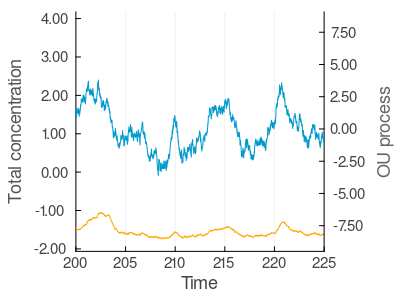

In [29]:
dt_save = 0.01;
Nts = 1:1:Nt
dts = Nts.*dt_save

plot_totprof(dts,data_m,200000)
# ylims!(1.2,1.7)
plot!(twinx(), dts, ou, 
      color=:deepskyblue3,
      ylabel="OU process", yguidefont = font(12, "Helvetica",:deepskyblue3),
      yformatter = x -> @sprintf("%.2f", x),
      legend=false, alpha = 1.0)
xlims!(200,225)
# savefig("../Figures/Simulations/OU/Ou_EpiField_Tau0.01_SD1.0.pdf")


In [18]:
#Calculation of covariance: requires Statistics.jl

t_init = 20000;
t_end = 30000;

data_m_avg = zeros(t_end-t_init);

for i in eachindex(data_m_avg)
    data_m_avg[i] = mean(@view(data_m[i-1+t_init,:]));
end

cor(data_m_avg,ou[t_init+1:t_end])

0.023640351240677104

## Simulate comparison case: local $\phi^6$

In [103]:
#Simulate phi^6 without polymer to see response

dt::Float64 = 0.001;
Ttot::Float64 = 500;
Nt_c::Int64 = Int(Ttot/dt);

phis::Vector{Float64} = zeros(Nt_c);
OU_c::Vector{Float64} = zeros(Nt_c);
OU_c[1] = randn(); #Initial random condition

rd::Float64 = 1.0;
lambda::Float64 = 0.1;

ou_tau::Float64 = 10.0;
ou_sd::Float64 = 1.0;
dt_noise::Float64 = sqrt(dt*2*ou_sd);

for i in 1:(Nt_c-1)
    if i÷100 == 0
        # println("Time step $i.")
    end
    phis[i+1] = phis[i]+dt*(-rd*phis[i]-lambda*phis[i]*phis[i]*phis[i]-phis[i]*phis[i]*phis[i]*phis[i]*phis[i]+OU_c[i])+dt_noise*randn();
    OU_c[i+1] = OU_c[i]+dt*(-ou_tau*OU_c[i])+dt_noise*randn();
end

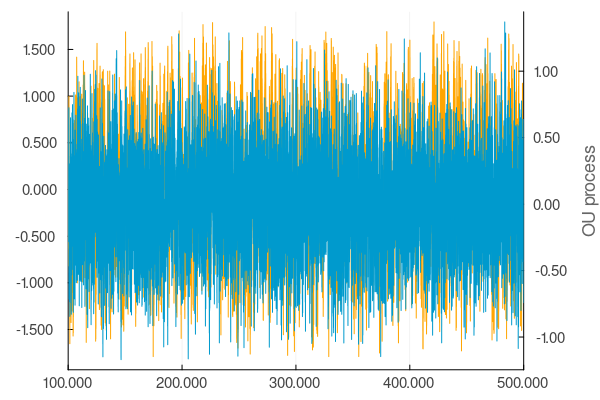

In [ ]:
#Plot
dts_c = dt:dt:Ttot;


plot(dts_c,phis, c=:orange, legend=false, size=(400,300))
# ylims!(1.2,2.0)
# ylims!(1.2,2.0)
plot!(twinx(), dts_c, OU_c, 
      color=:deepskyblue3,
      ylabel="OU process", yguidefont = font(12, "Helvetica",:deepskyblue3),
      yformatter = x -> @sprintf("%.2f", x),
      legend=false, alpha = 1.0)
xlims!(100,500)

In [ ]:
#Calculate covariance: requires Statistics.jl

t_init = 100000;
t_end = 500000;

cor(phis[t_init:t_end], OU_c[t_init:t_end])

-0.015661673650436463

## Compare correlations between polymer model and local model for different taus

In [50]:
using Statistics
using Printf

# Fixed parameters
N = 2^10
Nt = 30000
folder = "/data/others/ciarchi/PolymerDyn/DataSim/OU/"
flag = "Slurm"
flag_pert = "NoPert"
flag_ind = "NoExtInd"

# Analysis window
t_init_sim = 20000
t_end_sim = 30000
t_init_ref = 100000
t_end_ref = 500000

# Reference model parameters
dt::Float64 = 0.001
Ttot::Float64 = 500
Nt_c::Int64 = Int(Ttot / dt)
rd::Float64 = 1.0
lambda::Float64 = 0.1
ou_sd::Float64 = 1.0
dt_noise::Float64 = sqrt(dt * 2 * ou_sd)

# Discover all particle files and extract (seed, run_idx) from filename
particle_pattern = Regex(
    "particles_(\\d+)_$(flag)_$(flag_pert)_$(flag_ind)_$(Nt)_$(N)_5\\.00_1\\.00_-(\\d+)\\.bin"
)

results = []

for fname in readdir(folder)
    pm = match(particle_pattern, fname)
    pm === nothing && continue
    seed_str = pm.captures[1]      # e.g. "22"
    run_idx  = pm.captures[2]      # e.g. "0"

    # Find all OU files matching this (seed, run_idx) pair
    ou_pattern = Regex(
        "ou_(\\d+\\.\\d+)_1\\.00_$(seed_str)_$(flag)_$(flag_pert)_$(flag_ind)_$(Nt)_$(N)_5\\.00_1\\.00_-$(run_idx)\\.bin"
    )

    for ouname in readdir(folder)
        om = match(ou_pattern, ouname)
        om === nothing && continue
        ou_tau_str = om.captures[1]
        ou_tau_val = parse(Float64, ou_tau_str)

        filename_p  = joinpath(folder, fname)
        filename_ou = joinpath(folder, ouname)

        println("Processing: seed=$(seed_str), tau=$(ou_tau_str), run=$(run_idx)")
        println("  Particles: $(filename_p)")
        println("  OU:        $(filename_ou)")

        # ── Load binary data ──────────────────────────────────────────────
        array_save_p  = Array{Float32}(undef, Nt * N * 4)
        array_save_ou = Array{Float32}(undef, Nt)
        read!(filename_p,  array_save_p)
        read!(filename_ou, array_save_ou)

        data_m = zeros(Float32, Nt, N)
        ou     = zeros(Float32, Nt)

        Threads.@threads for t in 0:(Nt - 1)
            for p in 0:(N - 1)
                data_m[t+1, p+1] = array_save_p[t*(N*4) + p*4 + 4]
            end
            ou[t+1] = array_save_ou[t+1]
        end

        # ── Simulation correlation ────────────────────────────────────────
        data_m_avg = [mean(@view(data_m[i - 1 + t_init_sim, :])) for i in 1:(t_end_sim - t_init_sim)]
        cor_sim = cor(data_m_avg, ou[t_init_sim+1:t_end_sim])

        # ── Reference model (same ou_tau) ─────────────────────────────────
        phis  = zeros(Nt_c)
        OU_c  = zeros(Nt_c)
        OU_c[1] = randn()

        for i in 1:(Nt_c - 1)
            phis[i+1] = phis[i] + dt * (-rd * phis[i] - lambda * phis[i]^3 - phis[i]^5 + OU_c[i]) + dt_noise * randn()
            OU_c[i+1] = OU_c[i] + dt * (-ou_tau_val * OU_c[i]) + dt_noise * randn()
        end

        cor_ref = cor(phis[t_init_ref:t_end_ref], OU_c[t_init_ref:t_end_ref])

        ratio = cor_sim / cor_ref

        println("  cor_sim=$(round(cor_sim, digits=4)), cor_ref=$(round(cor_ref, digits=4)), ratio=$(round(ratio, digits=4))\n")

        push!(results, (seed=seed_str, tau=ou_tau_val, run=run_idx, cor_sim=cor_sim, cor_ref=cor_ref, ratio=ratio))
    end
end

# ── Summary table ─────────────────────────────────────────────────────────────
println("\n$(repeat('─', 65))")
println("  seed  tau        run   cor_sim    cor_ref    ratio")
println(repeat('─', 65))
for r in sort(results, by = x -> (x.seed, x.tau, x.run))
    @printf("  %-5s %-10s %-5s %-10.4f %-10.4f %-10.4f\n", r.seed, r.tau, r.run, r.cor_sim, r.cor_ref, r.ratio)
end
println(repeat('─', 65))

Processing: seed=20, tau=0.01, run=4
  Particles: /data/others/ciarchi/PolymerDyn/DataSim/OU/particles_20_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-4.bin
  OU:        /data/others/ciarchi/PolymerDyn/DataSim/OU/ou_0.01_1.00_20_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-4.bin
  cor_sim=0.9826, cor_ref=0.8964, ratio=1.0961

Processing: seed=21, tau=10.00, run=0
  Particles: /data/others/ciarchi/PolymerDyn/DataSim/OU/particles_21_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-0.bin
  OU:        /data/others/ciarchi/PolymerDyn/DataSim/OU/ou_10.00_1.00_21_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-0.bin
  cor_sim=0.5408, cor_ref=0.0378, ratio=14.2991

Processing: seed=22, tau=100.00, run=0
  Particles: /data/others/ciarchi/PolymerDyn/DataSim/OU/particles_22_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-0.bin
  OU:        /data/others/ciarchi/PolymerDyn/DataSim/OU/ou_100.00_1.00_22_Slurm_NoPert_NoExtInd_30000_1024_5.00_1.00_-0.bin
  cor_sim=0.0236, cor_ref=0.0025, ratio=9.2741

Processing: see

In [ ]:
#Plot

taus = [x.tau for x in results];
abs_corsim = abs.([x.cor_sim for x in results]);
abs_corref = abs.([x.cor_ref for x in results]);


taus_filtered = taus[taus .!= 0.1]
abs_ratios_filtered = abs_ratios[taus .!= 0.1]

plot(sort(1.0./taus_filtered),abs_corsim[sortperm(taus_filtered)], label="Polymer", size=(400,300),xaxis=:log10, linewidth=4.0)
plot!(sort(1.0./taus_filtered),abs_corref[sortperm(taus_filtered)], label="Local", size=(400,300),xaxis=:log10, linewidth=4.0)
xlabel!("Time scale of external signal")
ylabel!("Correlation with external signal")
# savefig("../Figures/Simulations/OU/Comparison_Polymer_Local_CorrWithSignal_vs_Tau.pdf")


"/data/others/ciarchi/PolymerDyn/Figures/Simulations/OU/Comparison_Polymer_Local_CorrWithSignal_vs_Tau.pdf"